In [86]:
import numpy as np 
import pandas as pd 
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
import seaborn as sns

from sklearn.metrics import precision_score, recall_score, ConfusionMatrixDisplay,confusion_matrix, classification_report,accuracy_score, f1_score
import random
import seaborn as sns

from sklearn.metrics import classification_report,confusion_matrix

from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D, Flatten, Dense, GlobalMaxPooling2D, AveragePooling2D, GlobalAveragePooling2D,Dropout
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping


from tensorflow.keras.models import Sequential
import warnings
warnings.filterwarnings("ignore")
from PIL import Image

In [28]:
IMG_SHAPE = (250,250)
IMG_SHAPE_GN = (250,250,3)

**Reading the data from .txt**

In [29]:
#reading csv
df = pd.read_csv('../input/cats-and-dogs-breeds-classification-oxford-dataset/annotations/annotations/list.txt')

#The first 4 rows consists of the information about breeds
info = df.head(4).copy()


In [30]:
#Reading the data after 5th row
df = df.loc[5:,]

#Processing the columns
df[['CLASS-ID','SPECIES','BREED','ID']] = df['#Image CLASS-ID SPECIES BREED ID'].str.split(expand=True) 

#Dropping unnecessary columns
df = df.drop('#Image CLASS-ID SPECIES BREED ID',axis=1)

#renaming the columns
df = df.rename(columns={"CLASS-ID": "image", "SPECIES": "CLASS-ID", 'BREED' : "SPECIES", "ID":"BREED ID"})


#converting the object type to int type
df[["CLASS-ID","SPECIES","BREED ID"]] = df[["CLASS-ID","SPECIES","BREED ID"]].astype(int)

In [31]:
df

,image,CLASS-ID,SPECIES,BREED ID
5,Abyssinian_100,1,1,1
6,Abyssinian_101,1,1,1
7,Abyssinian_102,1,1,1
8,Abyssinian_103,1,1,1
9,Abyssinian_104,1,1,1
...,...,...,...,...
7349,yorkshire_terrier_96,37,2,25
7350,yorkshire_terrier_97,37,2,25
7351,yorkshire_terrier_98,37,2,25
7352,yorkshire_terrier_99,37,2,25


In [32]:
df['image'] = df['image'].apply(lambda x : str(x)+'.jpg')
df = df.reset_index()
df = df.drop('index',axis=1)

In [33]:
df

,image,CLASS-ID,SPECIES,BREED ID
0,Abyssinian_100.jpg,1,1,1
1,Abyssinian_101.jpg,1,1,1
2,Abyssinian_102.jpg,1,1,1
3,Abyssinian_103.jpg,1,1,1
4,Abyssinian_104.jpg,1,1,1
...,...,...,...,...
7344,yorkshire_terrier_96.jpg,37,2,25
7345,yorkshire_terrier_97.jpg,37,2,25
7346,yorkshire_terrier_98.jpg,37,2,25
7347,yorkshire_terrier_99.jpg,37,2,25


In [34]:
#Extracting the classname/breed of the animal
df['classname'] = df['image'].apply(lambda x: str(x)[0:str(x).index('_')])
df.head()

,image,CLASS-ID,SPECIES,BREED ID,classname
0,Abyssinian_100.jpg,1,1,1,Abyssinian
1,Abyssinian_101.jpg,1,1,1,Abyssinian
2,Abyssinian_102.jpg,1,1,1,Abyssinian
3,Abyssinian_103.jpg,1,1,1,Abyssinian
4,Abyssinian_104.jpg,1,1,1,Abyssinian


**Visualizing the bar plot for all the species**

In [35]:
def breed_count(df, title):
    breed_count  = df['classname'].value_counts()

    plt.figure(figsize=(20,5))
    sns.barplot(x=breed_count.index, y=breed_count.values, alpha=0.8)
    plt.title('Value count of number of ' + title)
    plt.ylabel('Number of Occurrences', fontsize=12)
    plt.xlabel('Breed Names', fontsize=10)
    plt.xticks(rotation=90)
    plt.show()
    

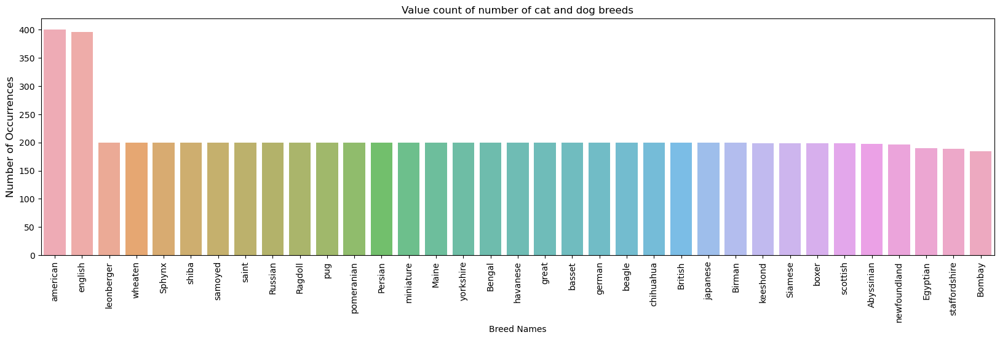

In [36]:
breed_count(df, "cat and dog breeds")

**Seperating dog and cat species**

In [37]:
df_cat = df[df['SPECIES']==1] #cat : 1
df_dog = df[df['SPECIES']==2] #dog : 2

In [38]:
print("Number of samples in df_cat ",df_cat.shape[0])
print("Number of samples in df_dog ",df_dog.shape[0])

Number of samples in df_cat  2371
Number of samples in df_dog  4978


**Cat species**

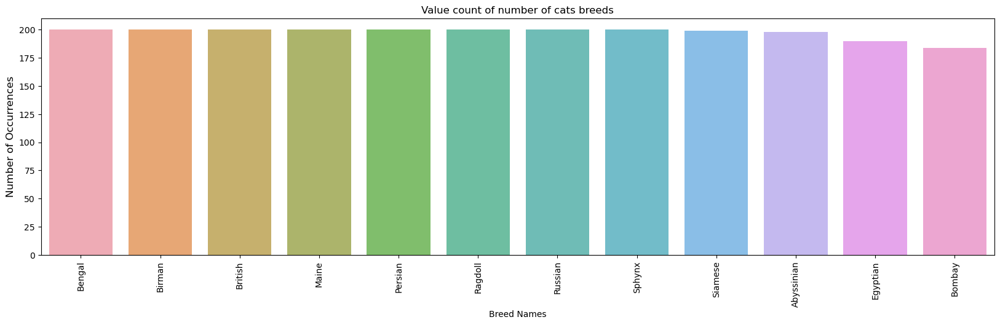

In [39]:
breed_count(df_cat, "cats breeds")

**Dog species**

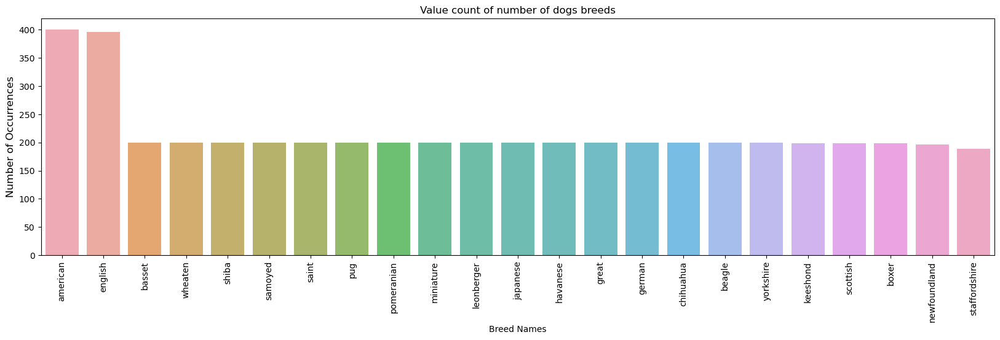

In [40]:
breed_count(df_dog, "dogs breeds")

In [41]:
# Process image (input) for the model
def process(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (250,250))
    img = tf.keras.applications.mobilenet.preprocess_input(img)
    img = np.expand_dims(img, axis=0)
    return img

# Read image
def get_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image
    


**Visualize samples**

In [42]:
def visualize_samples(datagen, row_col_len=4, figsize=None):
    random_indexes = np.random.randint(0, len(datagen.labels), row_col_len**2)
    
    classes = np.array(list(datagen.class_indices))
    labels = classes[np.array(datagen.labels)[random_indexes]]
    filepaths = pd.Series(datagen.filenames)[random_indexes]
    filepaths = "../input/cats-and-dogs-breeds-classification-oxford-dataset/images/images/" + filepaths

    images = filepaths.apply(get_image).reset_index(drop=True)
    figsize = figsize or np.array((row_col_len, row_col_len)) * 4
    fig, ax = plt.subplots(row_col_len, row_col_len, figsize=figsize)
    for i in range(row_col_len):
        for j in range(row_col_len):
            sample_index = i * row_col_len + j
            ax[i,j].imshow(images[sample_index])
            ax[i,j].set_title(labels[sample_index])
            ax[i,j].set_axis_off()
    plt.show()

**Visualizing the classification**

In [43]:
# Make classifications & visualize results
def visualize_classifications(model, datagen, row_col_len=4, figsize=None):
    random_indexes = np.random.randint(0, len(datagen.labels), row_col_len**2)
    
    classes = np.array(list(datagen.class_indices))
    labels = classes[np.array(datagen.labels)[random_indexes]]
    filepaths = pd.Series(datagen.filenames)[random_indexes]
    filepaths = "../input/cats-and-dogs-breeds-classification-oxford-dataset/images/images/" + filepaths
#     print(filepaths[0])
    images = filepaths.apply(get_image).reset_index(drop=True)
    processed_images = np.vstack(images.apply(process).to_numpy()[:])
    
    y_pred = classes[np.argmax(model.predict(processed_images, verbose=0), axis=1)]
    y_true = labels
    
    figsize = figsize or np.array((row_col_len, row_col_len)) * 4
    fig, ax = plt.subplots(row_col_len, row_col_len, figsize=figsize)
    
    for i in range(row_col_len):
        for j in range(row_col_len):
            sample_index = i * row_col_len + j
            ax[i,j].imshow(images[sample_index])
            ax[i,j].set_title(f"Y true({y_true[sample_index]}) | Y pred ({y_pred[sample_index]})")
            ax[i,j].set_axis_off()
    plt.show()


**Data Augmentation**

In [53]:
train_datagen = ImageDataGenerator(    
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    vertical_flip=True,
                                    validation_split=0.2,
                                    rotation_range=90,
                                    width_shift_range=0.2, 
                                   height_shift_range=0.2
                                  )


validation_datagen = ImageDataGenerator(
        preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
        validation_split=0.2)

In [56]:
def datagen_flow_dataframe(df,train_datagen,validation_datagen):
    
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df,
        directory='../input/cats-and-dogs-breeds-classification-oxford-dataset/images/images',
        x_col="image",
        y_col='classname',
        target_size=IMG_SHAPE,
        batch_size=128,
        class_mode="categorical",
        subset='training'
)

    valid_gen_flow = validation_datagen.flow_from_dataframe(
            dataframe=df,
            directory='../input/cats-and-dogs-breeds-classification-oxford-dataset/images/images',
            x_col='image',
            y_col='classname',
            target_size=IMG_SHAPE,
            batch_size=128,
            class_mode="categorical",
            subset='validation', shuffle=False)
    
    return train_gen_flow, valid_gen_flow

**Cat generator**

In [57]:
train_gen_flow_cat, valid_gen_flow_cat = datagen_flow_dataframe(df_cat,train_datagen,validation_datagen)

Found 1897 validated image filenames belonging to 12 classes.
Found 474 validated image filenames belonging to 12 classes.


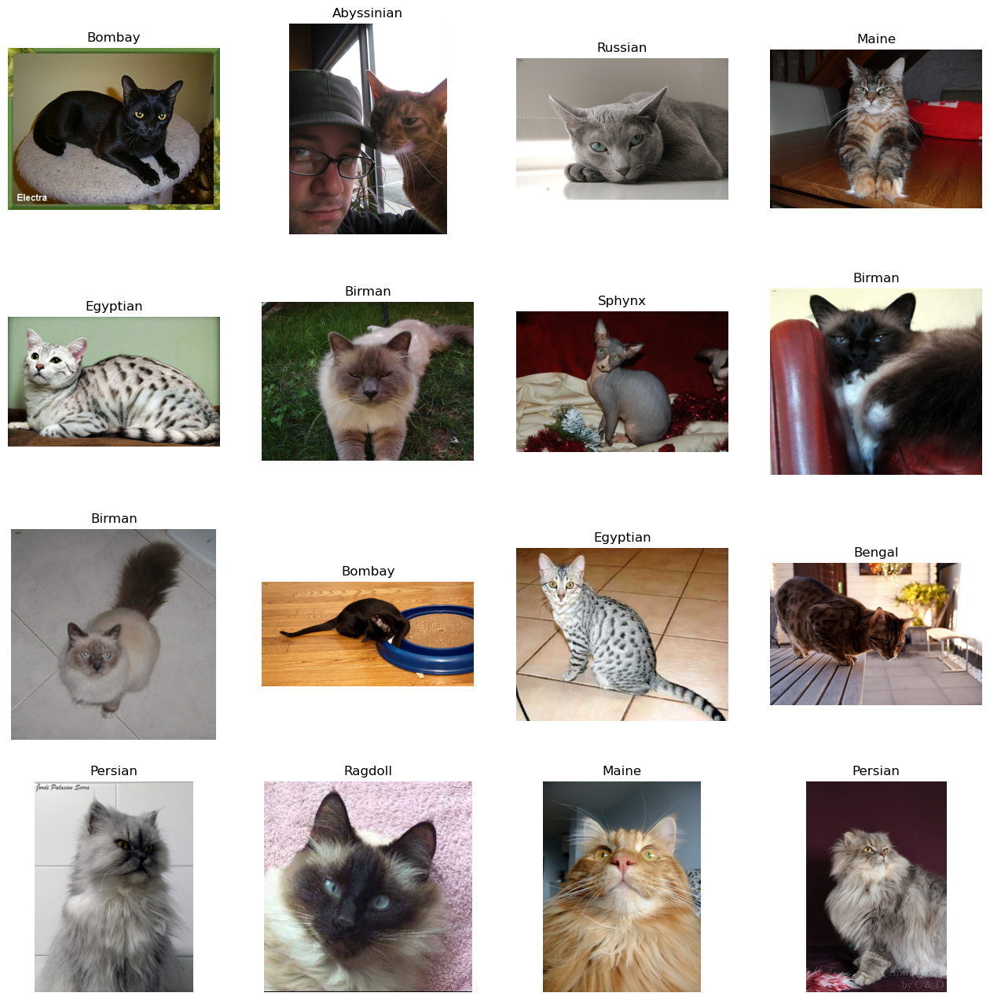

In [58]:
visualize_samples(train_gen_flow_cat)

**Dog generator**

In [59]:
train_gen_flow_dog, valid_gen_flow_dog = datagen_flow_dataframe(df_dog,train_datagen,validation_datagen)

Found 3983 validated image filenames belonging to 23 classes.
Found 995 validated image filenames belonging to 23 classes.


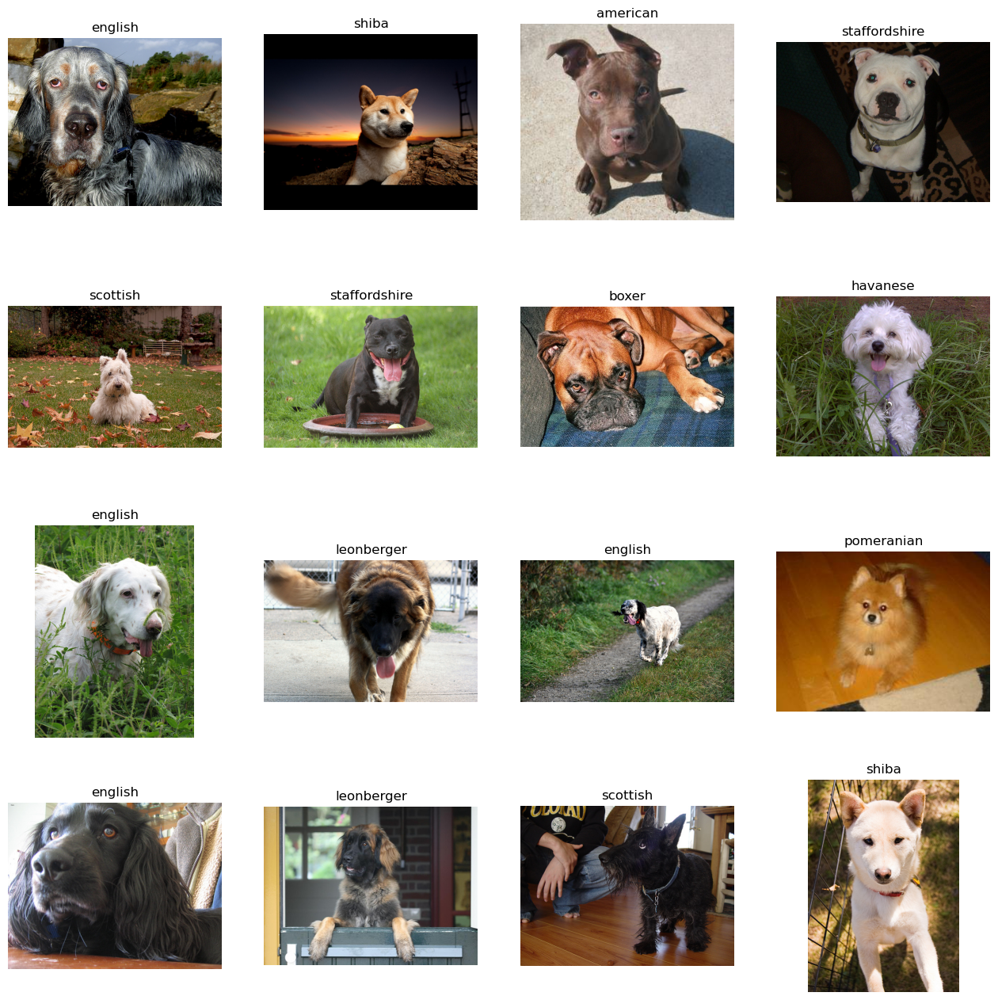

In [60]:
visualize_samples(train_gen_flow_dog)

**Model Training**

In [61]:
def train_model(model, train_generator, validation_generator, epochs, name):
    
    path_cp = name + '_weights.hdf5'
    rlr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.1, patience = 4, verbose = 1, 
                                min_delta = 1e-4, min_lr = 1e-4, mode = 'min', cooldown=1)
    
    ckp = ModelCheckpoint(path_cp,monitor = 'val_loss',
                      verbose = 1, save_best_only = True, mode = 'min')
    
    es = EarlyStopping(monitor = 'val_loss', min_delta = 1e-4, patience = 7,mode = 'min', restore_best_weights = True, verbose = 1)
  
    # Fitting the model
    history = model.fit(train_generator,
                      epochs = epochs, 
                      validation_data = validation_generator, 
                      verbose = 1,
                      callbacks = [rlr,es,ckp])
    return history

**Cat model classifier**

In [62]:
pretrainedModel_cat = tf.keras.applications.MobileNetV2(
    input_shape=IMG_SHAPE_GN,
     include_top=False,
     weights='imagenet',
     pooling='avg'
)
pretrainedModel_cat.trainable = False

inputs = pretrainedModel_cat.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrainedModel_cat.output)
x = tf.keras.layers.Dense(64, activation='relu')(x)

outputs = tf.keras.layers.Dense(12, activation='softmax')(x)

model_1 = tf.keras.Model(inputs=inputs, outputs=outputs)
model_1.compile(loss='categorical_crossentropy',optimizer=tf.optimizers.Adam(learning_rate=0.01), metrics=['acc'])

model_1.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                                           

**Fitting the model**

In [63]:
train_history = train_model(model_1, train_gen_flow_cat, valid_gen_flow_cat, epochs = 50,name="cat")

Epoch 1/50
15/15 [==============================] - ETA: 0s - loss: 3.3921 - acc: 0.2288
Epoch 1: val_loss improved from inf to 1.63137, saving model to cat_weights.hdf5
15/15 [==============================] - 70s 4s/step - loss: 3.3921 - acc: 0.2288 - val_loss: 1.6314 - val_acc: 0.4093 - lr: 0.0100
Epoch 2/50
15/15 [==============================] - ETA: 0s - loss: 1.2293 - acc: 0.5430
Epoch 2: val_loss improved from 1.63137 to 0.97016, saving model to cat_weights.hdf5
15/15 [==============================] - 41s 3s/step - loss: 1.2293 - acc: 0.5430 - val_loss: 0.9702 - val_acc: 0.6540 - lr: 0.0100
Epoch 3/50
15/15 [==============================] - ETA: 0s - loss: 0.8026 - acc: 0.7180
Epoch 3: val_loss improved from 0.97016 to 0.63361, saving model to cat_weights.hdf5
15/15 [==============================] - 38s 3s/step - loss: 0.8026 - acc: 0.7180 - val_loss: 0.6336 - val_acc: 0.7785 - lr: 0.0100
Epoch 4/50
15/15 [==============================] - ETA: 0s - loss: 0.6518 - acc: 0.77

In [64]:
#test data
model_1.evaluate(valid_gen_flow_cat)

4/4 [==============================] - 3s 662ms/step - loss: 0.3858 - acc: 0.8734


[0.38577768206596375, 0.8734177350997925]

In [65]:
#Saving the model
tf.keras.models.save_model(model_1,"cat_model.h5")

In [66]:
#saving the history
import pickle
with open('cat_history.pkl', 'wb') as file_pi:
    pickle.dump(train_history.history, file_pi)

#loading the history
with open('cat_history.pkl', "rb") as file_pi:
    history = pickle.load(file_pi)

dict_keys(['loss', 'acc', 'val_loss', 'val_acc', 'lr'])


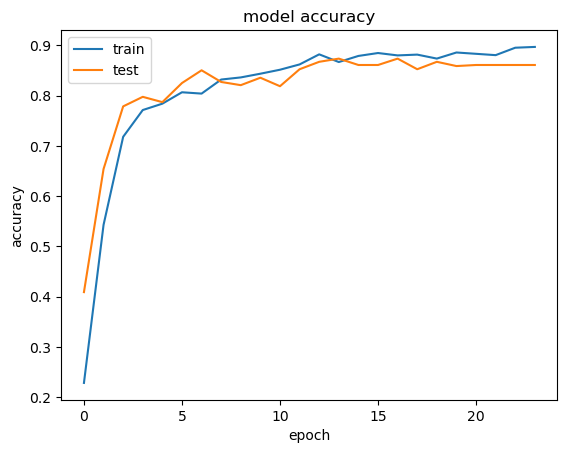

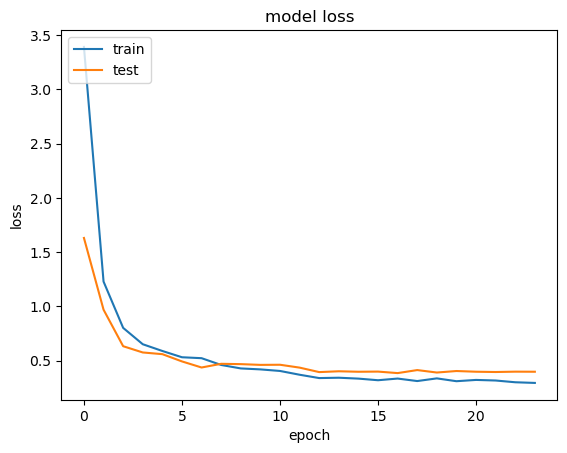

In [67]:
# list all data in history
print(history.keys())
# summarize history for accuracy
plt.plot(history['acc'])
plt.plot(history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')




plt.show()
# summarize history for loss
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

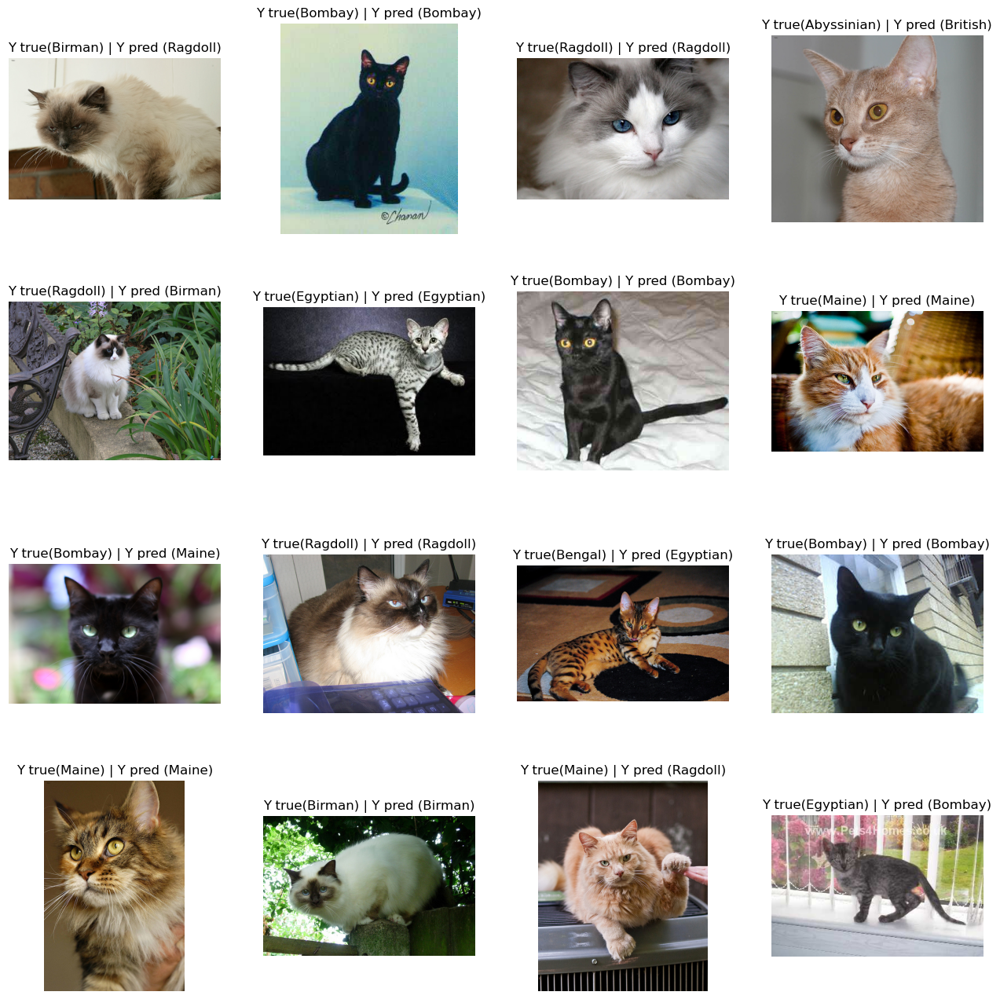

In [68]:
visualize_classifications(model_1, valid_gen_flow_cat)

In [69]:
class_names = list(valid_gen_flow_cat.class_indices.keys())

4/4 [==============================] - 4s 678ms/step


<Axes: >

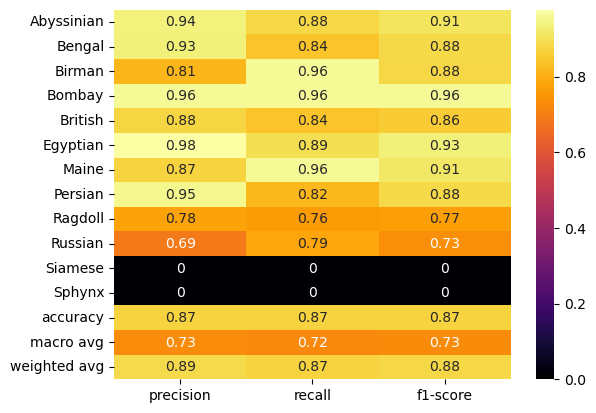

In [70]:
#Predicted label
y_pred = model_1.predict(valid_gen_flow_cat)
y_pred_label = np.argmax(y_pred,axis=1)


#true labels
y_test = valid_gen_flow_cat.classes

#classification report
class_report =  classification_report(y_test,y_pred_label,target_names=class_names,output_dict=True)
sns.heatmap(pd.DataFrame(class_report).iloc[:-1, :].T, annot=True,cmap='inferno')

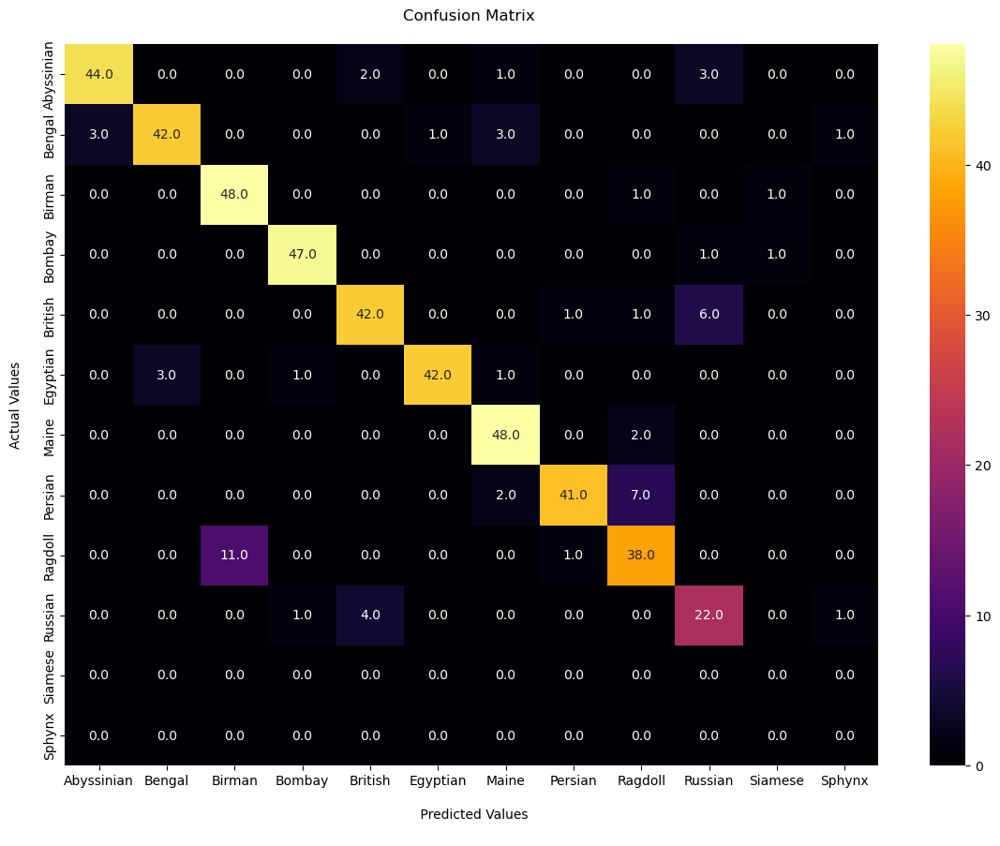

In [74]:
conf_matrix = confusion_matrix(y_test, y_pred_label)
plt.figure(figsize=(14,10))
fx=sns.heatmap(confusion_matrix(y_test,y_pred_label), annot=True, fmt=".1f",cmap="inferno")
fx.set_title('Confusion Matrix \n')
fx.set_xlabel('\n Predicted Values\n')
fx.set_ylabel('Actual Values\n')
fx.xaxis.set_ticklabels(class_names)
fx.yaxis.set_ticklabels(class_names)
plt.show()

**Dog classifier**

In [75]:
pretrainedModel_dog = tf.keras.applications.MobileNetV2(
    input_shape=IMG_SHAPE_GN,
     include_top=False,
     weights='imagenet',
     pooling='avg'
)
pretrainedModel_dog.trainable = False

inputs = pretrainedModel_dog.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrainedModel_dog.output)
x = tf.keras.layers.Dense(64, activation='relu')(x)

outputs = tf.keras.layers.Dense(23, activation='softmax')(x)

model_2 = tf.keras.Model(inputs=inputs, outputs=outputs)
model_2.compile(loss='categorical_crossentropy',optimizer=tf.optimizers.Adam(learning_rate=0.01), metrics=['acc'])

model_2.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  
                                )                                                           

In [76]:
train_history_2 = train_model(model_2, train_gen_flow_dog, valid_gen_flow_dog, epochs = 50,name="dog")

Epoch 1/50
32/32 [==============================] - ETA: 0s - loss: 2.2196 - acc: 0.3836
Epoch 1: val_loss improved from inf to 0.74490, saving model to dog_weights.hdf5
32/32 [==============================] - 128s 4s/step - loss: 2.2196 - acc: 0.3836 - val_loss: 0.7449 - val_acc: 0.7980 - lr: 0.0100
Epoch 2/50
32/32 [==============================] - ETA: 0s - loss: 0.9813 - acc: 0.6914
Epoch 2: val_loss improved from 0.74490 to 0.50030, saving model to dog_weights.hdf5
32/32 [==============================] - 82s 3s/step - loss: 0.9813 - acc: 0.6914 - val_loss: 0.5003 - val_acc: 0.8663 - lr: 0.0100
Epoch 3/50
32/32 [==============================] - ETA: 0s - loss: 0.7948 - acc: 0.7459
Epoch 3: val_loss improved from 0.50030 to 0.47136, saving model to dog_weights.hdf5
32/32 [==============================] - 81s 3s/step - loss: 0.7948 - acc: 0.7459 - val_loss: 0.4714 - val_acc: 0.8633 - lr: 0.0100
Epoch 4/50
32/32 [==============================] - ETA: 0s - loss: 0.7683 - acc: 0.7

In [77]:
#test data evaluation
model_2.evaluate(valid_gen_flow_dog)

8/8 [==============================] - 6s 702ms/step - loss: 0.3652 - acc: 0.8935


[0.36518779397010803, 0.8934673070907593]

In [78]:
#Saving the model
tf.keras.models.save_model(model_2,"dog_model.h5")

In [79]:
#saving the history
import pickle
with open('dog_history.pkl', 'wb') as file_pi:
    pickle.dump(train_history_2.history, file_pi)

#loading the history
with open('dog_history.pkl', "rb") as file_pi:
    history = pickle.load(file_pi)

dict_keys(['loss', 'acc', 'val_loss', 'val_acc', 'lr'])


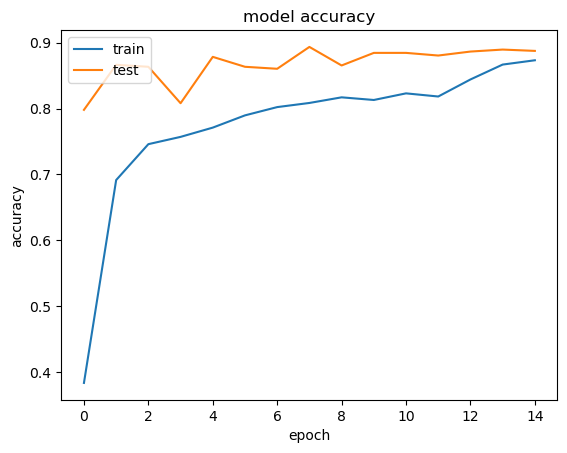

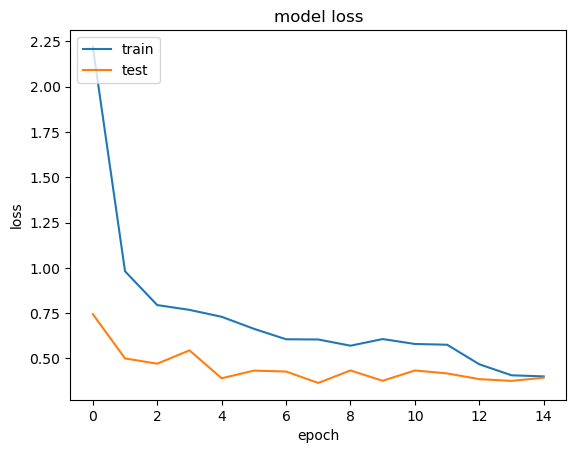

In [80]:
# list all data in history
print(history.keys())
# summarize history for accuracy
plt.plot(history['acc'])
plt.plot(history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')




plt.show()
# summarize history for loss
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

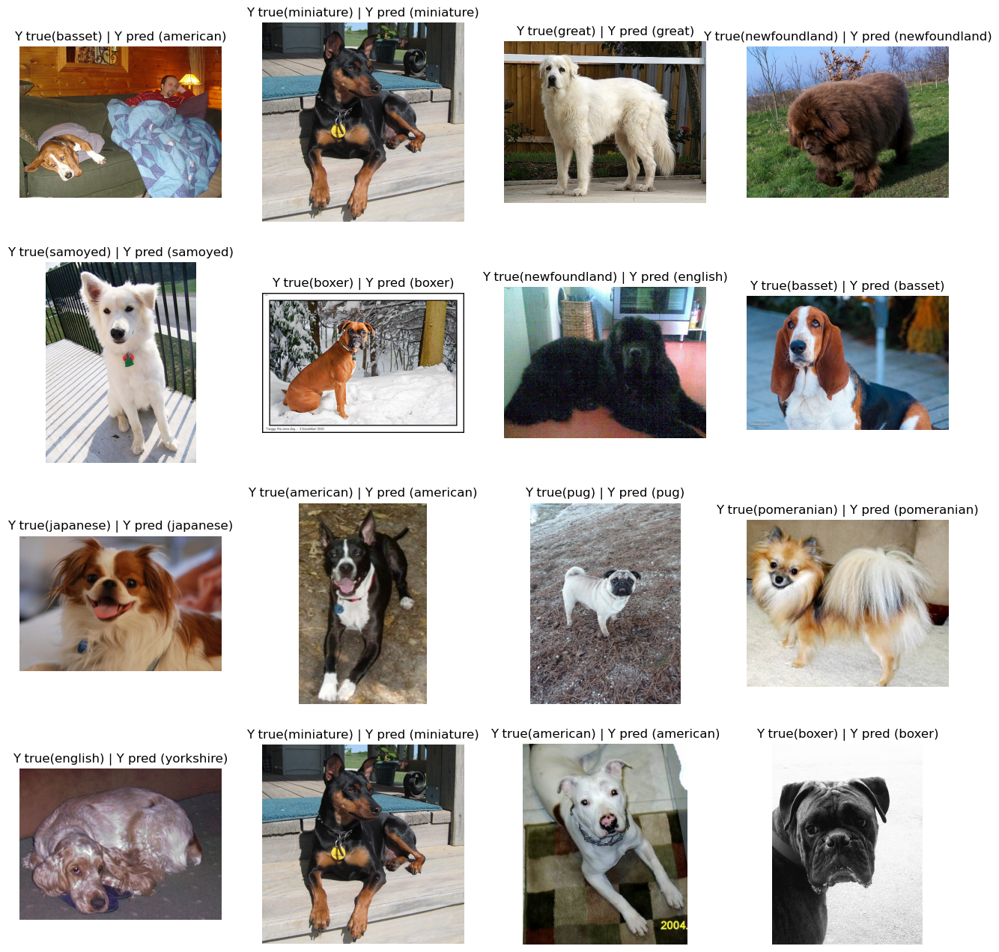

In [81]:
visualize_classifications(model_2, valid_gen_flow_dog)

In [82]:
class_names_2 = list(valid_gen_flow_dog.class_indices.keys())

8/8 [==============================] - 6s 702ms/step


<Axes: >

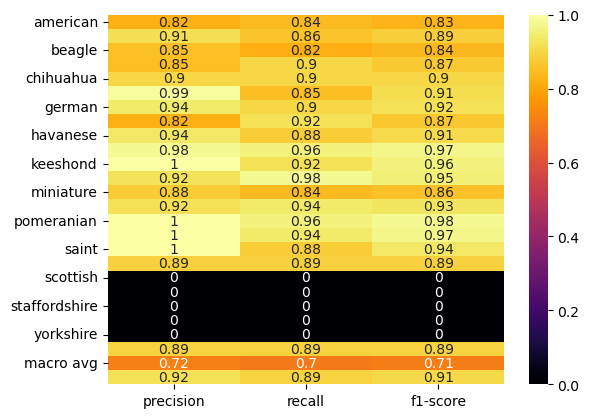

In [83]:
#Predicted label
y_pred = model_2.predict(valid_gen_flow_dog)
y_pred_label = np.argmax(y_pred,axis=1)
#y_pred_label[-1] = 19

#true labels
y_test = valid_gen_flow_dog.classes


#classification report
class_report =  classification_report(y_test,y_pred_label,target_names=class_names_2,output_dict=True)
sns.heatmap(pd.DataFrame(class_report).iloc[:-1, :].T, annot=True,cmap='inferno')

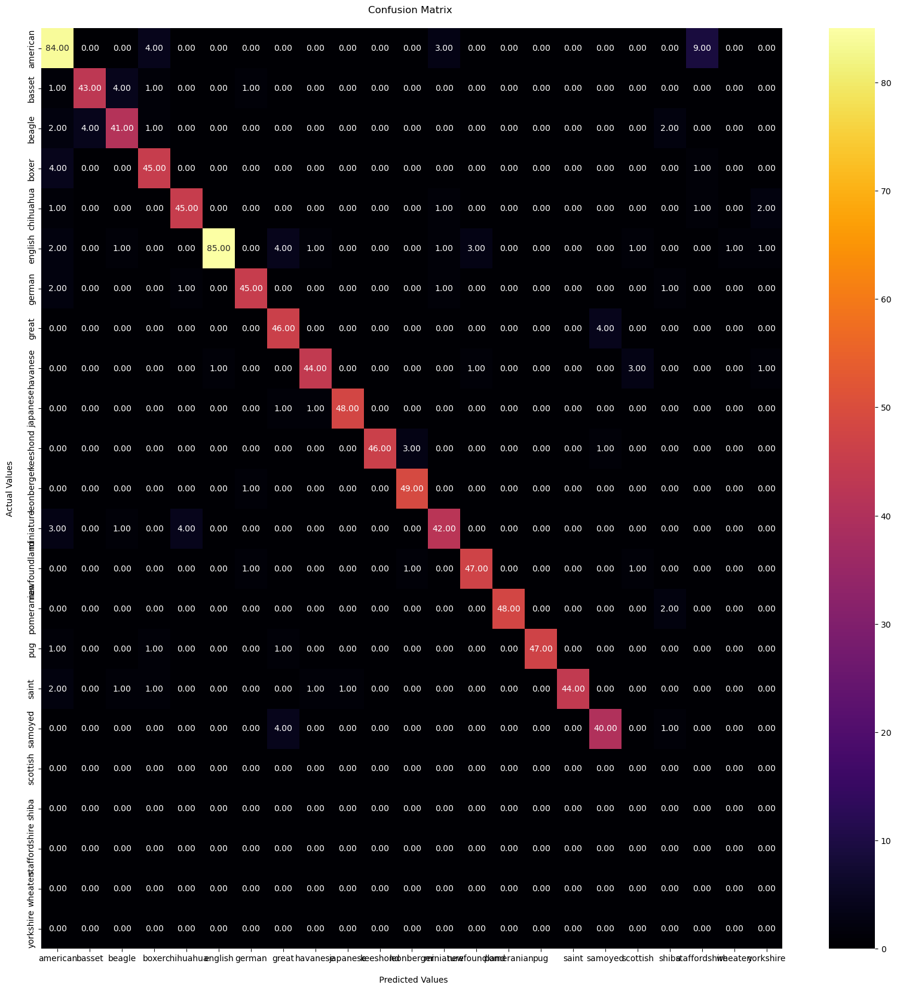

In [84]:
conf_matrix = confusion_matrix(y_test, y_pred_label)
plt.figure(figsize=(20,20))
fx=sns.heatmap(confusion_matrix(y_test,y_pred_label), annot=True, fmt=".2f",cmap="inferno")
fx.set_title('Confusion Matrix \n')
fx.set_xlabel('\n Predicted Values\n')
fx.set_ylabel('Actual Values\n')
fx.xaxis.set_ticklabels(class_names_2)
fx.yaxis.set_ticklabels(class_names_2)
plt.show()

**Testing custom input**

In [98]:
# Process image (input) for the model
def image_prediction(img):
    img  = cv2.imread(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (250,250))
    img = tf.keras.applications.mobilenet.preprocess_input(img)
    img = np.expand_dims(img, axis=0)
    return img

def predict(img,model_name):
    
    if model_name == "dog":
        dog_model = tf.keras.models.load_model("/kaggle/working/dog_model.h5")
        class_names = ['american', 'basset', 'beagle', 'boxer', 'chihuahua', 'english', 'german', 'great', 'havanese', 'japanese', 'keeshond', 'leonberger', 'miniature', 'newfoundland', 'pomeranian', 'pug', 'saint', 'samoyed', 'scottish', 'shiba', 'staffordshire', 'wheaten', 'yorkshire']
        
        img = image_prediction(img)
        y_pred = dog_model.predict(img)
        y_pred_label = int(np.argmax(y_pred,axis=1))
        print(f"The dog breed classified by model is {class_names[y_pred_label]}")
        
    else:
        cat_model = tf.keras.models.load_model("/kaggle/working/cat_model.h5")
        class_names = ['Abyssinian','Bengal','Birman','Bombay','British','Egyptian','Maine','Persian','Ragdoll','Russian''Siamese','Sphynx']
       
        img = image_prediction(img)
        y_pred = cat_model.predict(img)
        y_pred_label = int(np.argmax(y_pred,axis=1))
        print(f"The cat breed classified by model is {class_names[y_pred_label]}")

1/1 [==============================] - 1s 782ms/step
The dog breed classified by model is havanese


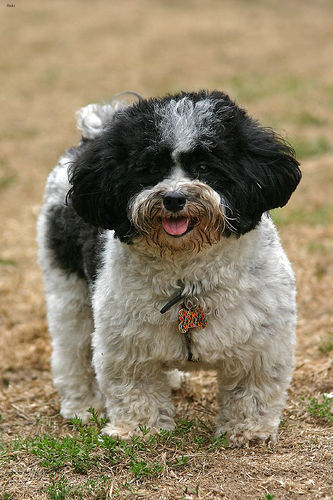

In [101]:
path = "/kaggle/input/cats-and-dogs-breeds-classification-oxford-dataset/images/images/havanese_1.jpg"

predict(path,"dog",end="\n\n")
Image.open(path)

['american', 'basset', 'beagle', 'boxer', 'chihuahua', 'english', 'german', 'great', 'havanese', 'japanese', 'keeshond', 'leonberger', 'miniature', 'newfoundland', 'pomeranian', 'pug', 'saint', 'samoyed', 'scottish', 'shiba', 'staffordshire', 'wheaten', 'yorkshire']


In [94]:
class_names

['Abyssinian',
 'Bengal',
 'Birman',
 'Bombay',
 'British',
 'Egyptian',
 'Maine',
 'Persian',
 'Ragdoll',
 'Russian',
 'Siamese',
 'Sphynx']